In [1]:
!pip install matplotlib
!pip install plotly
!pip install wandb


In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import train_test_split

In [3]:
import wandb

# Log in to wandb with API key
wandb.login(key='b7c7000aa0e0ca38abe543a871307157c86367b4')

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/praneeth-yeddu/.netrc
wandb: Currently logged in as: praneethyeddu (praneethyeddu-vellore-institute-of-technology) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [4]:
train_img_path = "cnn_data/craters/train/images"
train_lbl_path = "cnn_data/craters/train/labels"
valid_img_path = "cnn_data/craters/valid/images"
valid_lbl_path = "cnn_data/craters/valid/labels"
test_img_path = "cnn_data/craters/test/images"
test_lbl_path = "cnn_data/craters/test/labels/"
model_path = "cnn_data/best.pt"
data_yaml_path = "data.yaml"

In [5]:
def load_labels(label_path):
    label_files = os.listdir(label_path)
    data = []
    classes = set()
    for file in label_files:
        with open(os.path.join(label_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = list(map(float, line.strip().split()))
                data.append([file, *parts])
                classes.add(int(parts[0]))
    df = pd.DataFrame(data, columns=['file', 'class', 'x_center', 'y_center', 'width', 'height'])
    return df, sorted(classes)

train_labels, train_classes = load_labels(train_lbl_path)
valid_labels, valid_classes = load_labels(valid_lbl_path)
test_labels, test_classes = load_labels(test_lbl_path)

In [6]:

all_classes = sorted(set(train_classes + valid_classes + test_classes))
class_names = [f'class_{i}' for i in all_classes]

In [7]:
print("Train Labels")
print(train_labels.head(2))
print("\nValidation Labels")
print(valid_labels.head(2))
print("\nTest Labels")
print(test_labels.head(2))

Train Labels
                                                file  class  x_center  \
0  mars_crater--54-_jpg.rf.2313c9f439999313bfb527...    0.0  0.821094   
1  mars_crater--54-_jpg.rf.2313c9f439999313bfb527...    0.0  0.076563   

   y_center     width    height  
0  0.453906  0.028125  0.040625  
1  0.736719  0.023438  0.046875  

Validation Labels
                                                file  class  x_center  \
0  mars_crater--67-_jpg.rf.cf856f9fde7eb10f7f1524...    0.0  0.410156   
1  mars_crater--67-_jpg.rf.cf856f9fde7eb10f7f1524...    0.0  0.485938   

   y_center     width    height  
0  0.194531  0.025000  0.037500  
1  0.219531  0.046875  0.053125  

Test Labels
                                                file  class  x_center  \
0  mars_crater--60-_jpg.rf.df89b1f82e171f73f5402c...    0.0  0.975781   
1  mars_crater--60-_jpg.rf.df89b1f82e171f73f5402c...    0.0  0.084375   

   y_center     width    height  
0  0.288281  0.046094  0.256250  
1  0.350000  0.164844  

In [8]:
data_yaml_content = f"""
train: {train_img_path}
val: {valid_img_path}
test: {test_img_path}

nc: {len(all_classes)}  # number of classes
names: {class_names}  # class names
"""

with open(data_yaml_path, 'w') as f:
    f.write(data_yaml_content)

In [9]:
def plot_bounding_box_distribution(labels, title):
    labels['area'] = labels['width'] * labels['height']
    fig = px.histogram(labels, x='area', nbins=50, title=title)
    fig.show()

plot_bounding_box_distribution(train_labels, 'Train Bounding Box Area Distribution')
plot_bounding_box_distribution(valid_labels, 'Validation Bounding Box Area Distribution')
plot_bounding_box_distribution(test_labels, 'Test Bounding Box Area Distribution')

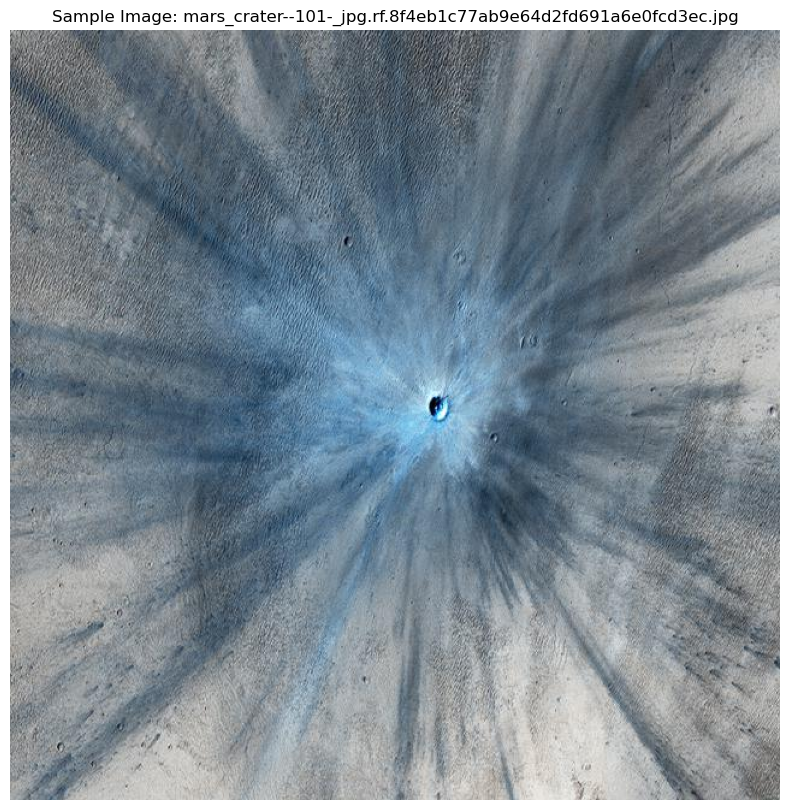

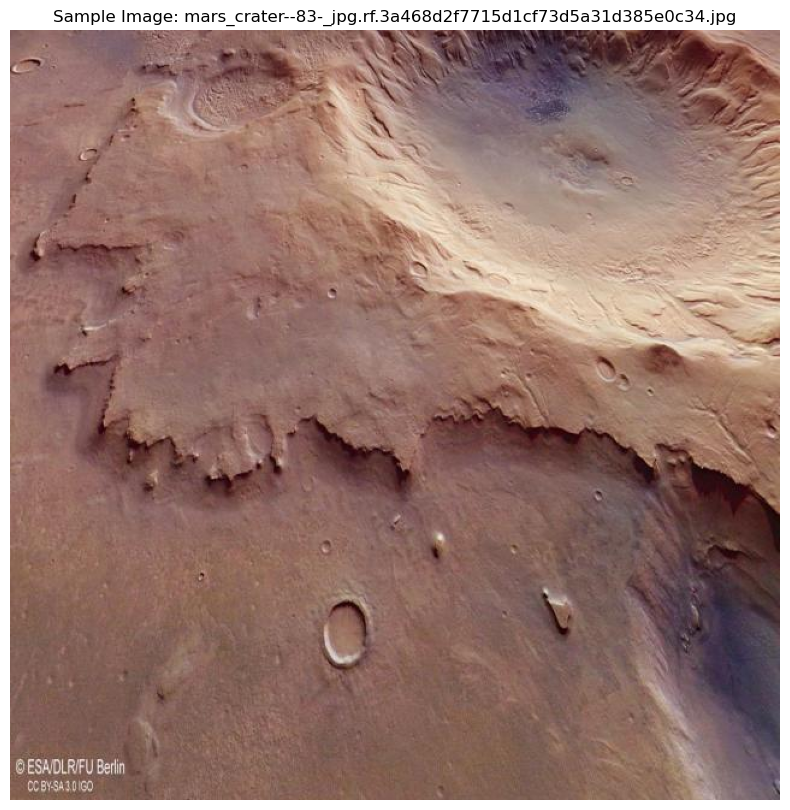

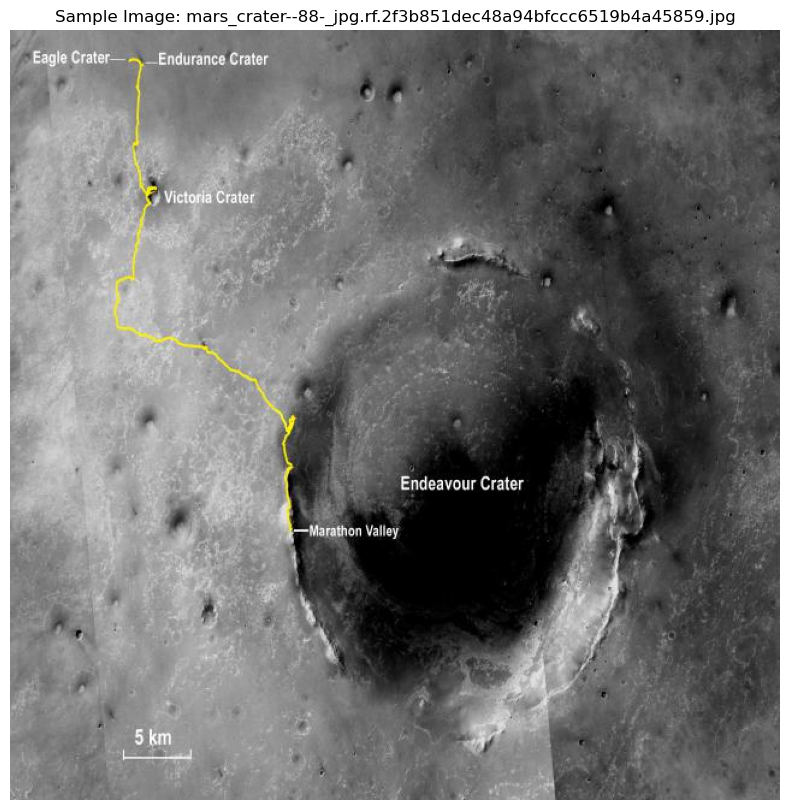

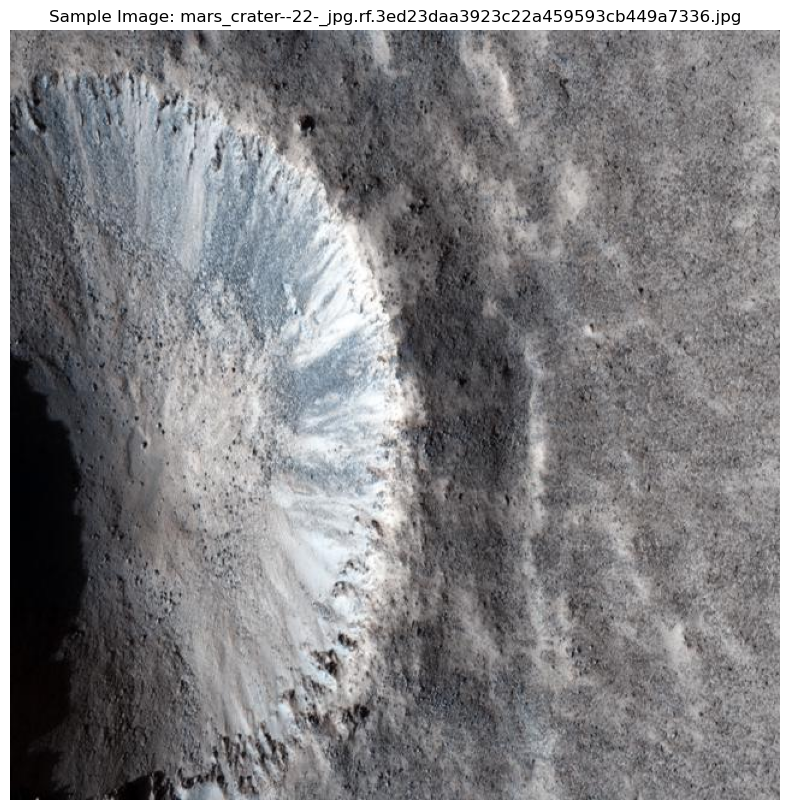

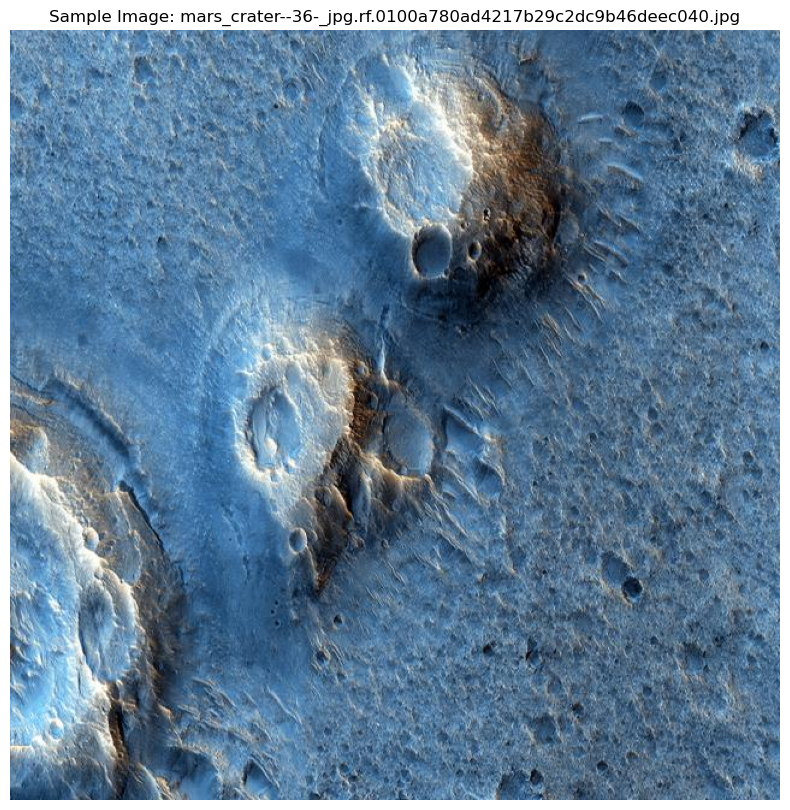

...

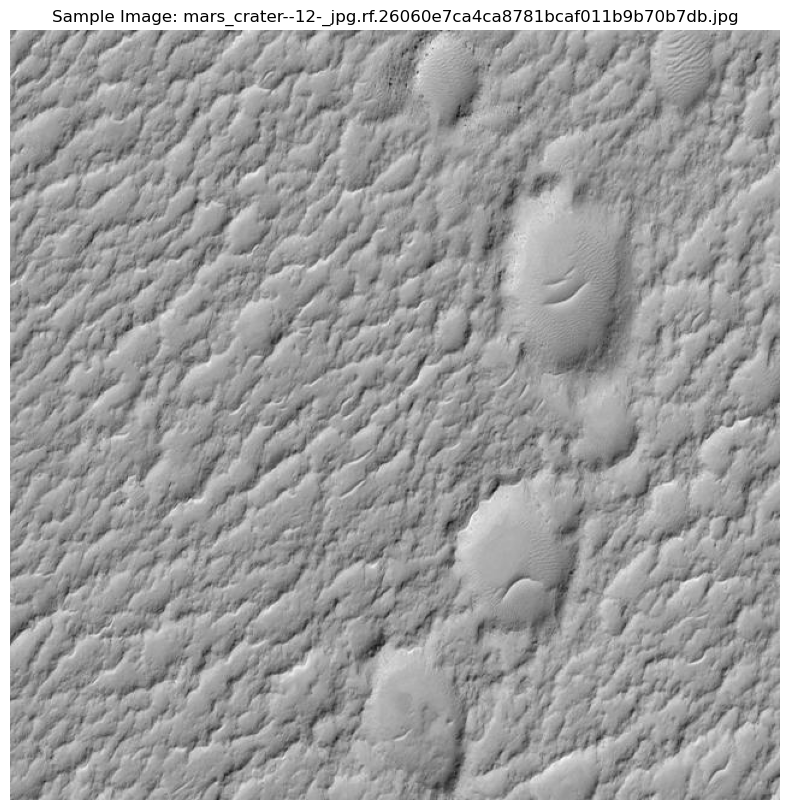

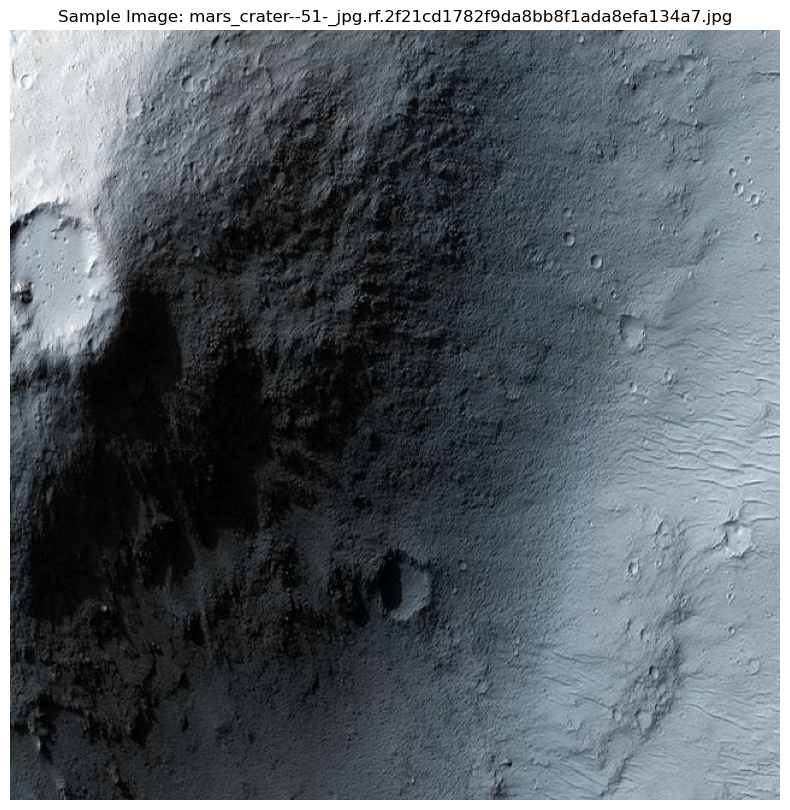

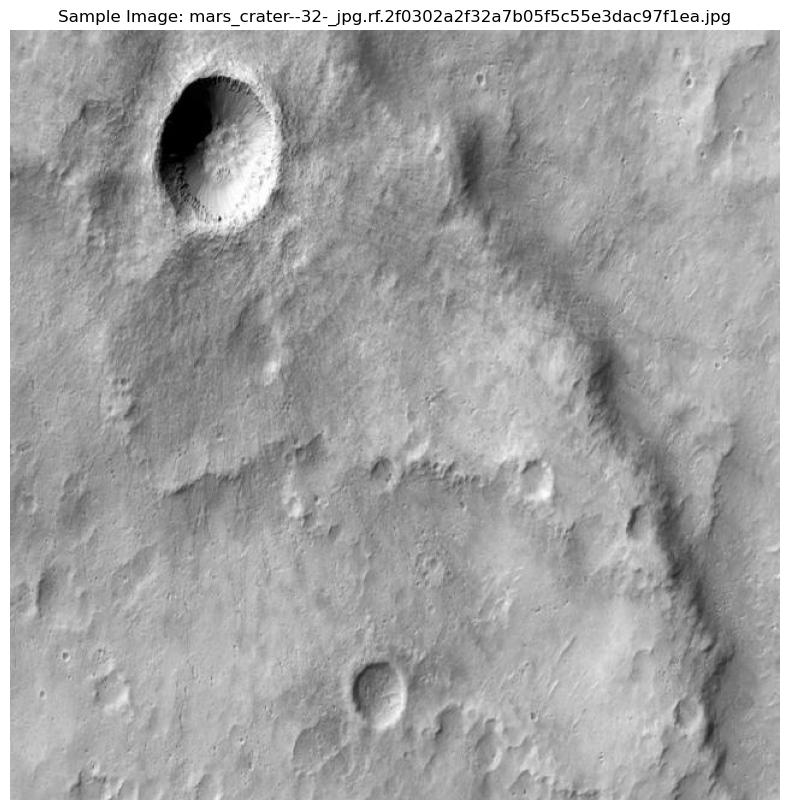

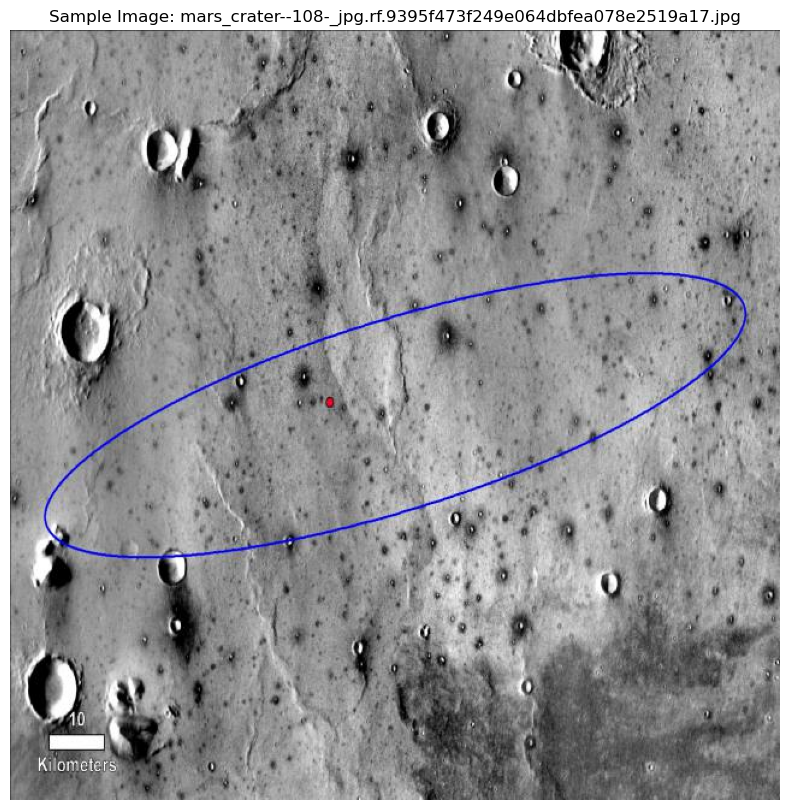

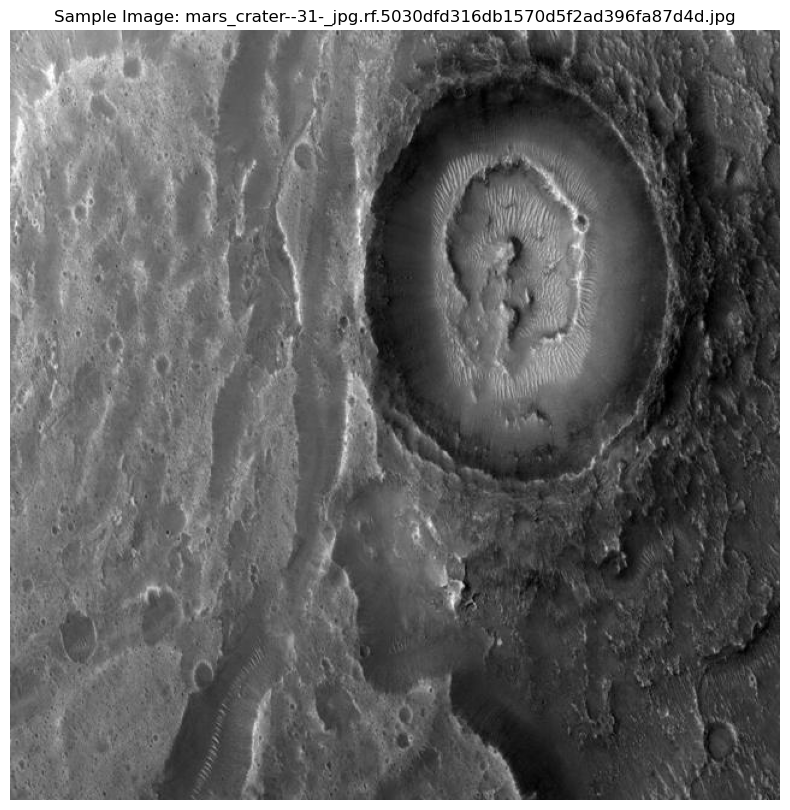

In [10]:
def visualize_sample_images(image_path, label_df, n_samples=5):
    image_files = os.listdir(image_path)[:n_samples]
    for img_file in image_files:
        img_path = os.path.join(image_path, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)
        
        labels = label_df[label_df['file'] == img_file]
        for _, label in labels.iterrows():
            x_center = int(label['x_center'] * img.shape[1])
            y_center = int(label['y_center'] * img.shape[0])
            width = int(label['width'] * img.shape[1])
            height = int(label['height'] * img.shape[0])
            x_min = x_center - width // 2
            y_min = y_center - height // 2
            
            rect = plt.Rectangle((x_min, y_min), width, height, edgecolor='red', facecolor='none', linewidth=2)
            ax.add_patch(rect)
        
        plt.title(f'Sample Image: {img_file}')
        plt.axis('off')
        plt.show()

visualize_sample_images(train_img_path, train_labels)
visualize_sample_images(valid_img_path, valid_labels)
visualize_sample_images(test_img_path, test_labels)

In [17]:
from ultralytics import YOLO
# Load the model
model = YOLO('yolov8n.pt')

In [19]:
import torch
torch.cuda.empty_cache()

In [21]:
model.train(data=data_yaml_path, epochs=50,device='cpu')

Ultralytics 8.3.162 🚀 Python-3.12.11 torch-2.7.1+cu126 CPU (11th Gen Intel Core(TM) i5-11320H 3.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretraine

train: Scanning /home/praneeth-yeddu/crater_detection/cnn_data/craters/train/labels.cache... 98 images, 9 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<?, ?it/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2937.4±542.8 MB/s, size: 71.8 KB)



val: Scanning /home/praneeth-yeddu/crater_detection/cnn_data/craters/valid/labels.cache... 26 images, 2 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]

Plotting labels to runs/detect/train4/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.866      3.374      1.539          6        640: 100%|██████████| 7/7 [00:23<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]

                   all         26        202     0.0151      0.584     0.0955     0.0379

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       2/50         0G      1.556      2.577      1.298         10        640: 100%|██████████| 7/7 [00:22<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

                   all         26        202     0.0208      0.802      0.189     0.0983

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       3/50         0G      1.556      1.701      1.242         34        640: 100%|██████████| 7/7 [00:21<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]

                   all         26        202     0.0208      0.802      0.214      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.553      1.959      1.241          6        640: 100%|██████████| 7/7 [00:22<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]

                   all         26        202     0.0213      0.822      0.199      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/50         0G      1.386      1.646      1.188          7        640: 100%|██████████| 7/7 [00:22<00:00,  3.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

                   all         26        202      0.898     0.0869      0.254      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/50         0G      1.516      1.541       1.23         19        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.749      0.148      0.244      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/50         0G      1.494      1.443      1.221         25        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.925      0.123      0.393      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/50         0G      1.471      1.496      1.228          7        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

                   all         26        202       0.75      0.158      0.283      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/50         0G      1.455       1.51       1.22         19        640: 100%|██████████| 7/7 [00:22<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.205     0.0743      0.074     0.0316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/50         0G      1.304      1.448      1.187          4        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

                   all         26        202      0.515      0.188      0.244      0.139

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      11/50         0G      1.506      1.498      1.253          9        640: 100%|██████████| 7/7 [00:21<00:00,  3.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]

                   all         26        202      0.203      0.139      0.102     0.0491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      12/50         0G      1.422       1.41      1.212         19        640: 100%|██████████| 7/7 [00:22<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.209      0.297      0.144       0.07

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      13/50         0G      1.431      1.411      1.185         18        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]

                   all         26        202      0.255      0.347      0.188     0.0957

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      14/50         0G       1.43      1.378      1.175         38        640: 100%|██████████| 7/7 [00:21<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]

                   all         26        202      0.459       0.46      0.345      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      15/50         0G      1.408      1.569      1.304          3        640: 100%|██████████| 7/7 [00:21<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]

                   all         26        202      0.363       0.53      0.362      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      16/50         0G      1.441      1.287      1.227         29        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]

                   all         26        202      0.305      0.553       0.32      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      17/50         0G      1.451      1.287      1.213         31        640: 100%|██████████| 7/7 [00:22<00:00,  3.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]

                   all         26        202      0.288       0.48      0.276      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      18/50         0G       1.45      1.347       1.21         10        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]

                   all         26        202       0.24      0.475      0.256      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         0G      1.443       1.42      1.237          5        640: 100%|██████████| 7/7 [00:21<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

                   all         26        202      0.367       0.46      0.393      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      20/50         0G      1.267      1.209      1.145         35        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]

                   all         26        202      0.456      0.545      0.522        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      21/50         0G      1.244      1.251      1.119          6        640: 100%|██████████| 7/7 [00:22<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

                   all         26        202      0.466      0.569      0.543      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      22/50         0G      1.345      1.335      1.158          8        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.543      0.525      0.534        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      23/50         0G      1.437      1.177      1.163         25        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.587       0.49      0.532      0.272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      24/50         0G      1.442      1.269      1.195         11        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

                   all         26        202      0.668       0.47      0.572      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      25/50         0G      1.325      1.182      1.148          6        640: 100%|██████████| 7/7 [00:22<00:00,  3.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

                   all         26        202      0.693      0.465      0.589      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      26/50         0G      1.319       1.14      1.159         14        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]

                   all         26        202      0.604       0.45      0.525      0.279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      27/50         0G      1.348      1.181      1.147         20        640: 100%|██████████| 7/7 [00:22<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

                   all         26        202      0.468      0.589      0.505      0.262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      28/50         0G      1.264      1.107      1.114         19        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]

                   all         26        202      0.504      0.649      0.531      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      29/50         0G      1.293      1.173      1.111          9        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]

                   all         26        202      0.582      0.592      0.598      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      30/50         0G      1.251      1.232      1.142          4        640: 100%|██████████| 7/7 [00:21<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

                   all         26        202      0.585      0.658       0.61      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      31/50         0G      1.259      1.086      1.126         26        640: 100%|██████████| 7/7 [00:22<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]

                   all         26        202      0.597      0.615      0.571      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      32/50         0G      1.309      1.112      1.139         15        640: 100%|██████████| 7/7 [00:21<00:00,  3.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.632      0.649      0.601      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      33/50         0G      1.265      1.068      1.117         18        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]

                   all         26        202      0.648      0.639       0.62      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50         0G      1.267      1.041      1.068         34        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]

                   all         26        202       0.65      0.663      0.644      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      35/50         0G      1.254      1.141      1.117          8        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]

                   all         26        202      0.711      0.619      0.666       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      36/50         0G      1.241     0.9857      1.091         15        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

                   all         26        202      0.679      0.606      0.667      0.359

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      37/50         0G      1.241      1.005      1.057         40        640: 100%|██████████| 7/7 [00:22<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]

                   all         26        202      0.713      0.604      0.663      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      38/50         0G      1.165      1.103      1.091          4        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]

                   all         26        202      0.721      0.619      0.661      0.332

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      39/50         0G      1.246      1.008      1.092         17        640: 100%|██████████| 7/7 [00:21<00:00,  3.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

                   all         26        202      0.748      0.639      0.664      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      40/50         0G      1.084     0.9597      1.067          6        640: 100%|██████████| 7/7 [00:21<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

                   all         26        202      0.739      0.646      0.683      0.363
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      41/50         0G      1.297      1.161      1.109          5        640: 100%|██████████| 7/7 [00:21<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]

                   all         26        202      0.728      0.634      0.683      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      42/50         0G       1.24       1.07      1.074         20        640: 100%|██████████| 7/7 [00:21<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

                   all         26        202      0.707      0.657      0.684      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      43/50         0G      1.181     0.9653      1.049          4        640: 100%|██████████| 7/7 [00:21<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]

                   all         26        202      0.732      0.621      0.683      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      44/50         0G      1.143     0.9792      1.092          5        640: 100%|██████████| 7/7 [00:21<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]

                   all         26        202      0.715      0.624      0.666      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      45/50         0G      1.153     0.9921      1.064         41        640: 100%|██████████| 7/7 [00:21<00:00,  3.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]

                   all         26        202      0.715      0.633      0.666      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      46/50         0G      1.105     0.9561      1.044          3        640: 100%|██████████| 7/7 [00:22<00:00,  3.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]

                   all         26        202       0.68      0.653      0.679       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50         0G      1.211     0.9644      1.095         22        640: 100%|██████████| 7/7 [00:22<00:00,  3.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]

                   all         26        202        0.7      0.624      0.678      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      48/50         0G      1.333      1.217      1.208          7        640: 100%|██████████| 7/7 [00:22<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]

                   all         26        202      0.712      0.634      0.681      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      49/50         0G      1.261      1.168      1.106         18        640: 100%|██████████| 7/7 [00:22<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]

                   all         26        202      0.719      0.649      0.687      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      50/50         0G      1.089     0.9551      1.048          4        640: 100%|██████████| 7/7 [00:22<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]

                   all         26        202      0.728      0.653      0.687      0.387

50 epochs completed in 0.340 hours.


Optimizer stripped from runs/detect/train4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 6.2MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.162 🚀 Python-3.12.11 torch-2.7.1+cu126 CPU (11th Gen Intel Core(TM) i5-11320H 3.20GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


                   all         26        202      0.718      0.649      0.687      0.388
Speed: 1.6ms preprocess, 64.9ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ae61aee4ec0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 